In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
def generate_vortex_flow(size=224, strength=1.0, center=None):
    if center is None:
        center = (size//2, size//2)
    
    y, x = np.mgrid[:size, :size]
    x = x - center[0]
    y = y - center[1]
    
    # Distance from center (add small epsilon to avoid division by zero)
    r = np.sqrt(x**2 + y**2) + 1e-6
    
    # Normalize by the size to control the strength
    r_norm = r / size
    
    # Compute tangential components (counter-clockwise vortex)
    u = -strength * y / r_norm
    v = strength * x / r_norm
    
    # Normalize the flow to have consistent magnitude
    magnitude = np.sqrt(u**2 + v**2)
    max_mag = np.max(magnitude)
    u = u / max_mag
    v = v / max_mag
    
    return np.stack([u, v], axis=-1)

def generate_sink_flow(size=224, strength=1.0, center=None):
    if center is None:
        center = (size//2, size//2)
    
    y, x = np.mgrid[:size, :size]
    x = x - center[0]
    y = y - center[1]
    
    # Distance from center (add small epsilon to avoid division by zero)
    r = np.sqrt(x**2 + y**2) + 1e-6
    
    # Normalize and get direction
    magnitude = r / size
    
    # Inward flow (negative for sink, positive for source)
    u = -strength * x / magnitude
    v = -strength * y / magnitude
    
    # Normalize to unit magnitude
    magnitude = np.sqrt(u**2 + v**2)
    max_mag = np.max(magnitude)
    u = u / max_mag
    v = v / max_mag
    
    return np.stack([u, v], axis=-1)

def generate_uniform_flow(size=224, angle=45):
    angle_rad = np.radians(angle)
    u = np.cos(angle_rad) * np.ones((size, size))
    v = np.sin(angle_rad) * np.ones((size, size))
    
    return np.stack([u, v], axis=-1)

def generate_complex_flow(size=224):
    # Create a vortex
    vortex1 = generate_vortex_flow(size, strength=1.0, center=(size//3, size//3))
    vortex2 = generate_vortex_flow(size, strength=-0.7, center=(2*size//3, 2*size//3))
    
    # Create a sink
    sink = generate_sink_flow(size, strength=0.5, center=(2*size//3, size//3))
    
    # Create a uniform flow
    uniform = generate_uniform_flow(size, angle=30)
    
    # Combine the flows with weights
    flow = 0.4 * vortex1 + 0.3 * vortex2 + 0.2 * sink + 0.1 * uniform
    
    # Normalize
    magnitude = np.sqrt(flow[..., 0]**2 + flow[..., 1]**2)
    max_mag = np.max(magnitude)
    flow = flow / max_mag
    
    return flow

In [3]:
def plot_flow_field(flow, title="Flow Field", density=20):
    plt.figure(figsize=(10, 10))
    
    # Create a custom colormap for the background (magnitude)
    colors = [(0, 0, 0.5), (0, 0.5, 1), (1, 1, 1), (1, 0.5, 0), (0.5, 0, 0)]
    cmap = LinearSegmentedColormap.from_list('flow_cmap', colors, N=100)
    
    # Calculate magnitude for coloring
    u, v = flow[..., 0], flow[..., 1]
    magnitude = np.sqrt(u**2 + v**2)
    
    # Plot the magnitude as a background
    plt.imshow(magnitude, cmap=cmap, origin='lower')
    plt.colorbar(label='Velocity Magnitude')
    
    # Subsample the grid for better visualization
    size = flow.shape[0]
    step = size // density
    y, x = np.mgrid[:size:step, :size:step]
    u_sub = u[::step, ::step]
    v_sub = v[::step, ::step]
    
    # Plot the flow vectors
    plt.quiver(x, y, u_sub, v_sub, 
               angles='xy', scale_units='xy', scale=0.1,
               color='black', width=0.003, 
               headwidth=4, headlength=5, headaxislength=3)
    
    plt.title(title)
    plt.tight_layout()
        
    plt.show()

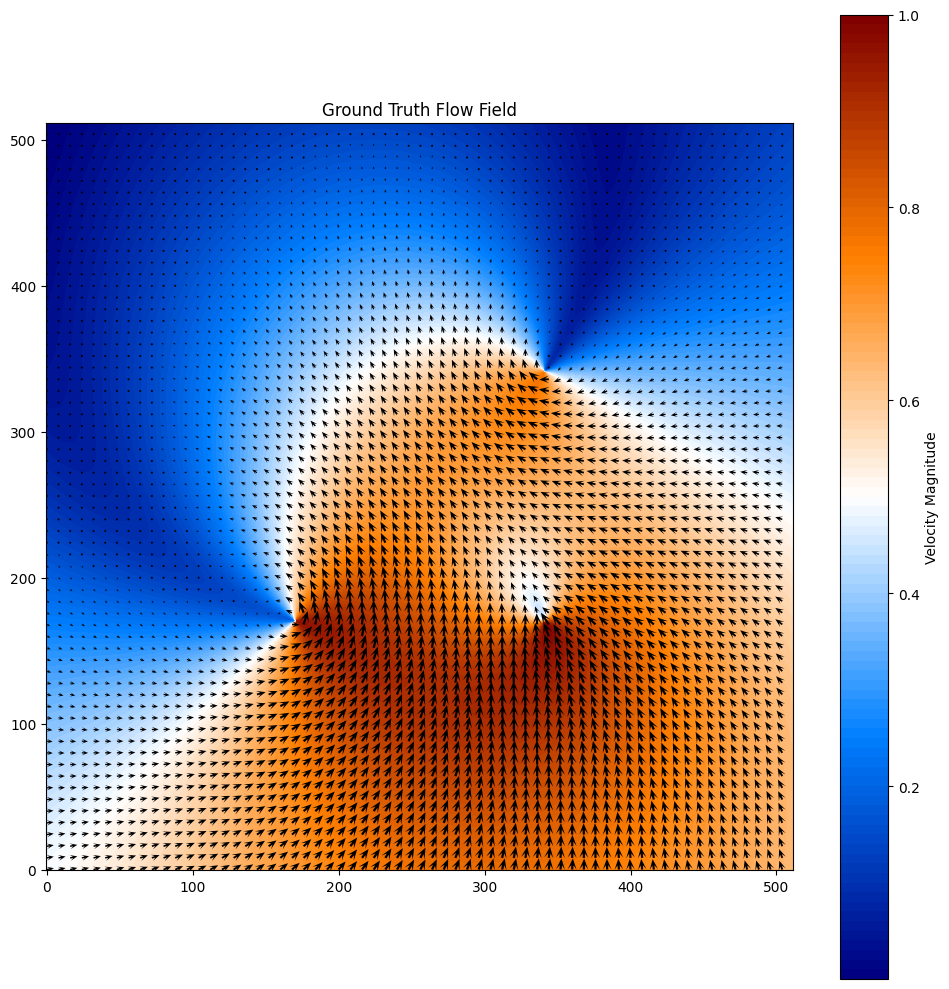

In [4]:
SIZE = 512
flow = generate_complex_flow(SIZE)
plot_flow_field(flow, "Ground Truth Flow Field", SIZE // 8)

In [5]:
class ODE(nn.Module):
	def __init__(self, input_dim, hidden_dims):
		super(ODE, self).__init__()
		dim_list = [input_dim] + list(hidden_dims) + [input_dim]
		layers = []
		for i in range(len(dim_list) - 1):
			layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
			if i < len(dim_list) - 2:
				layers.append(nn.ReLU())
		self.mlp = nn.Sequential(*layers)
	
	def forward(self, x):
		x = self.mlp(x)
		return x

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [7]:
y_coords = torch.arange(SIZE).view(1, SIZE, 1).expand(SIZE, SIZE, 1)
x_coords = torch.arange(SIZE).view(SIZE, 1, 1).expand(SIZE, SIZE, 1)
coordinate_tensor = torch.cat([x_coords, y_coords], dim=2)
coordinate_tensor = coordinate_tensor.float()
coordinate_tensor = coordinate_tensor.to(device)

In [ ]:
def fit_flow_field(ode, flow_field, coordinates):
    optim = torch.optim.Adam(ode.parameters(), lr=1e-3, weight_decay=0)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optim, gamma=0.999)

    for epoch in range(10000):
        estimated_flow_field = ode(coordinates)

        loss = F.mse_loss(flow_field, estimated_flow_field)
        if epoch == 0 or (epoch < 1000 and (epoch + 1) % 100 == 0) or (epoch + 1) % 1000 == 0:
            print(f'Epoch {epoch+1}, Loss: {loss}')

        optim.zero_grad()
        loss.backward()
        optim.step()
        scheduler.step()

    return estimated_flow_field

In [9]:
flow_tensor = torch.FloatTensor(flow)
flow_tensor = flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_flow_tensor = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 179.82894897460938
Current GPU memory: 784.63 MB, Peak: 1036.63 MB
Epoch 100, Loss: 0.07555036246776581
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 200, Loss: 0.06684774160385132
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 300, Loss: 0.0514494851231575
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 400, Loss: 0.04395183175802231
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 500, Loss: 0.03254763036966324
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 600, Loss: 0.021563857793807983
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 700, Loss: 0.018095042556524277
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 800, Loss: 0.015110804699361324
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 900, Loss: 0.013294780626893044
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 1000, Loss: 0.01179289910942316
Current GPU memory: 794.28 MB, Peak: 1305.77 MB
Epoch 2000, Loss: 0.005824062041938305
Current GPU memory: 794.2

KeyboardInterrupt: 

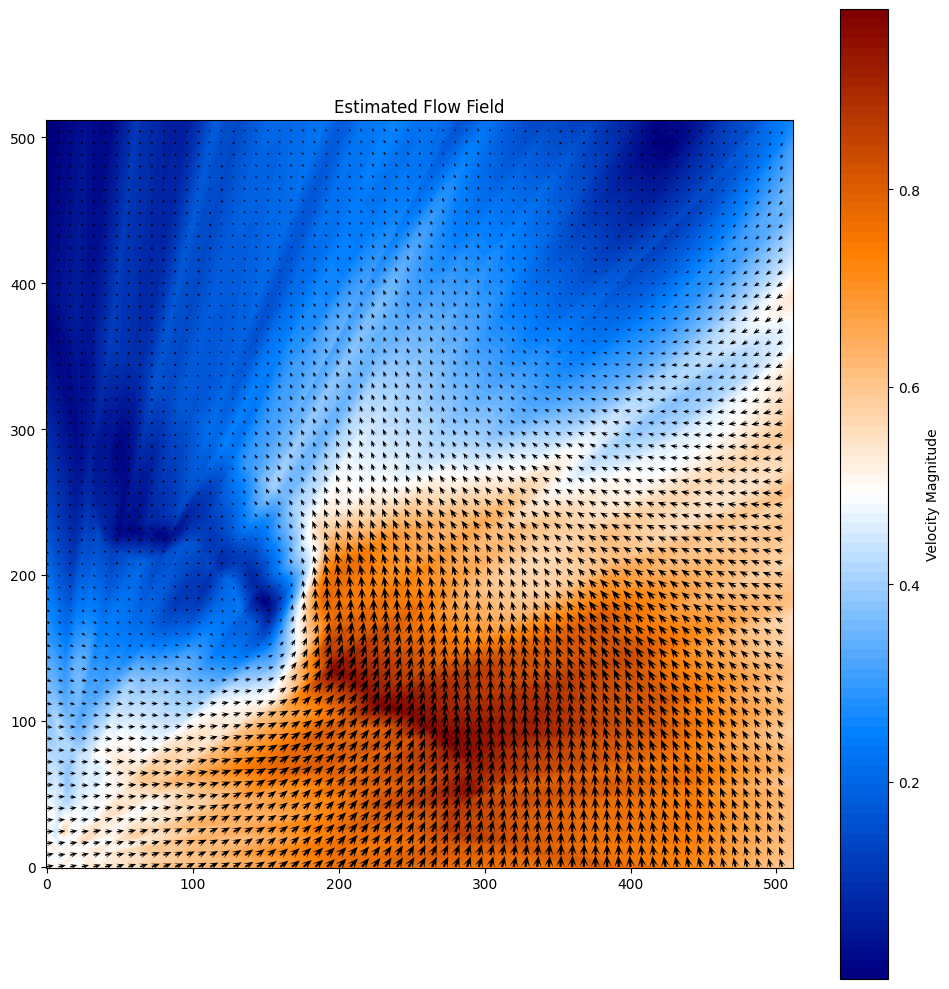

In [10]:
estimated_flow = estimated_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_flow, "Estimated Flow Field", SIZE // 8)

In [ ]:
class FourierFeatureODE(nn.Module):
    def __init__(self, input_dim, hidden_dims, fourier_scale=10.0, num_fourier_features=10, random_features=False):
        super(FourierFeatureODE, self).__init__()
        
        self.input_dim = input_dim
        self.num_fourier_features = num_fourier_features
        
        self.random_features = random_features
        self.register_buffer('B', torch.randn(input_dim, num_fourier_features) * fourier_scale)
        
        fourier_expanded_dim = input_dim + 2 * num_fourier_features
        dim_list = [fourier_expanded_dim] + list(hidden_dims) + [input_dim]
        layers = []
        for i in range(len(dim_list) - 1):
            layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
            if i < len(dim_list) - 2:
                layers.append(nn.ReLU())
        self.mlp = nn.Sequential(*layers)
    
    # Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains style?
    def compute_random_fourier_features(self, x):
        x_proj = torch.matmul(x, self.B)
        sin_features = torch.sin(2 * np.pi * x_proj)
        cos_features = torch.cos(2 * np.pi * x_proj)
        fourier_features = torch.cat([x, sin_features, cos_features], dim=-1)
        return fourier_features
    
    # NeRF/Transformer style
    def compute_positional_fourier_features(self, x):
        encodings = [x]
        for i in range(self.num_fourier_features // 2):
            freq = 2.0 ** i
            sin_features = torch.sin(freq * x)
            cos_features = torch.cos(freq * x)
            encodings.append(sin_features)
            encodings.append(cos_features)
        return torch.cat(encodings, dim=-1)

    def forward(self, x):
        x_fourier = self.compute_random_fourier_features(x) if self.random_features else self.compute_positional_fourier_features(x)
        output = self.mlp(x_fourier)
        return output

In [12]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_flow_tensor_ff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 1.0953289270401
Epoch 100, Loss: 0.019355200231075287
Epoch 200, Loss: 0.004550072830170393
Epoch 300, Loss: 0.002981959842145443
Epoch 400, Loss: 0.002284590620547533
Epoch 500, Loss: 0.0018380186520516872
Epoch 600, Loss: 0.0015058281132951379
Epoch 700, Loss: 0.001252105226740241
Epoch 800, Loss: 0.001072523184120655
Epoch 900, Loss: 0.0009301339741796255
Epoch 1000, Loss: 0.0008264186908490956
Epoch 2000, Loss: 0.0004135047201998532
Epoch 3000, Loss: 0.0003074685810133815
Epoch 4000, Loss: 0.0002649100497364998
Epoch 5000, Loss: 0.00024478978593833745
Epoch 6000, Loss: 0.00023472004977520555
Epoch 7000, Loss: 0.0002296866150572896
Epoch 8000, Loss: 0.0002272599085699767
Epoch 9000, Loss: 0.0002261366171296686
Epoch 10000, Loss: 0.00022563757374882698


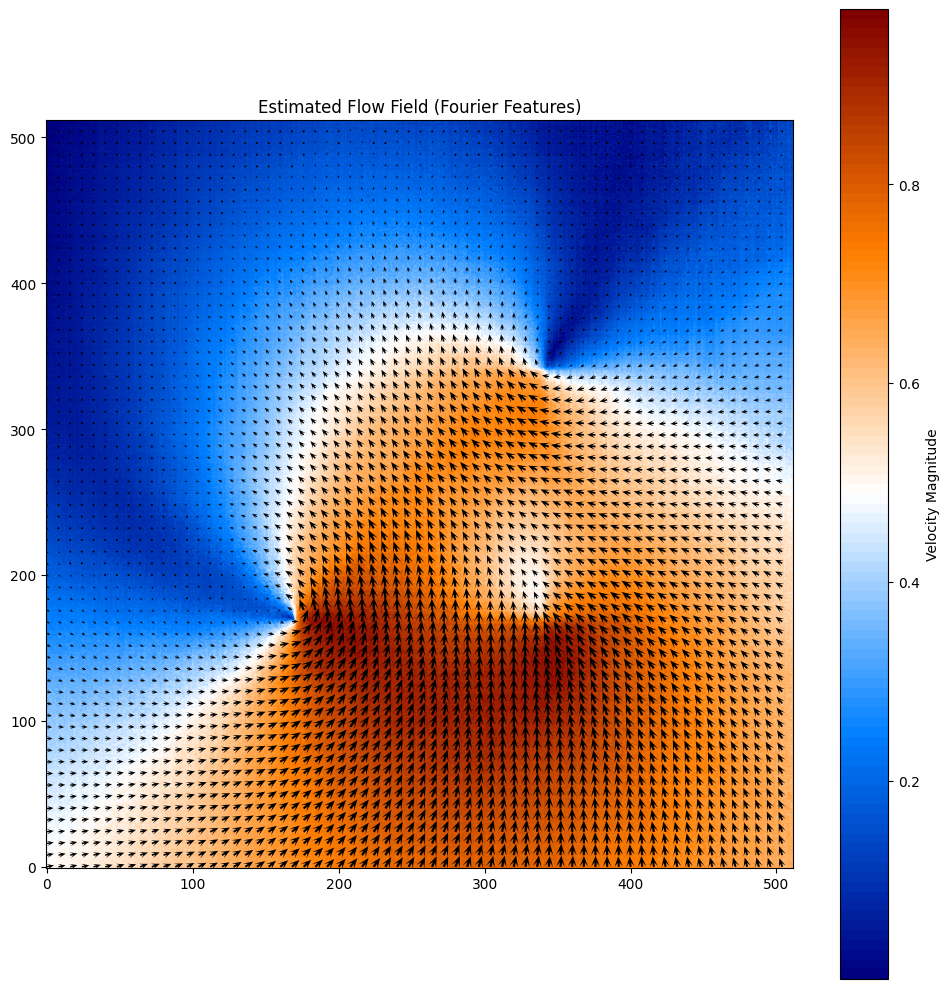

In [13]:
estimated_flow_ff = estimated_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_flow_ff, "Estimated Flow Field (Fourier Features)", SIZE // 8)

In [14]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126, random_features=True).to(device)
estimated_flow_tensor_rff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.9881806969642639
Epoch 100, Loss: 0.01923060044646263
Epoch 200, Loss: 0.00835418701171875
Epoch 300, Loss: 0.005848168395459652
Epoch 400, Loss: 0.004328316077589989
Epoch 500, Loss: 0.0035027065314352512
Epoch 600, Loss: 0.0029879887588322163
Epoch 700, Loss: 0.002556674648076296
Epoch 800, Loss: 0.0022900502663105726
Epoch 900, Loss: 0.002044491935521364
Epoch 1000, Loss: 0.0018599384929984808
Epoch 2000, Loss: 0.0010196517687290907
Epoch 3000, Loss: 0.0007836511358618736
Epoch 4000, Loss: 0.0006890205550007522
Epoch 5000, Loss: 0.0006444417522288859
Epoch 6000, Loss: 0.000622423947788775
Epoch 7000, Loss: 0.0006116601871326566
Epoch 8000, Loss: 0.0006065606721676886
Epoch 9000, Loss: 0.000604235683567822
Epoch 10000, Loss: 0.0006032030796632171


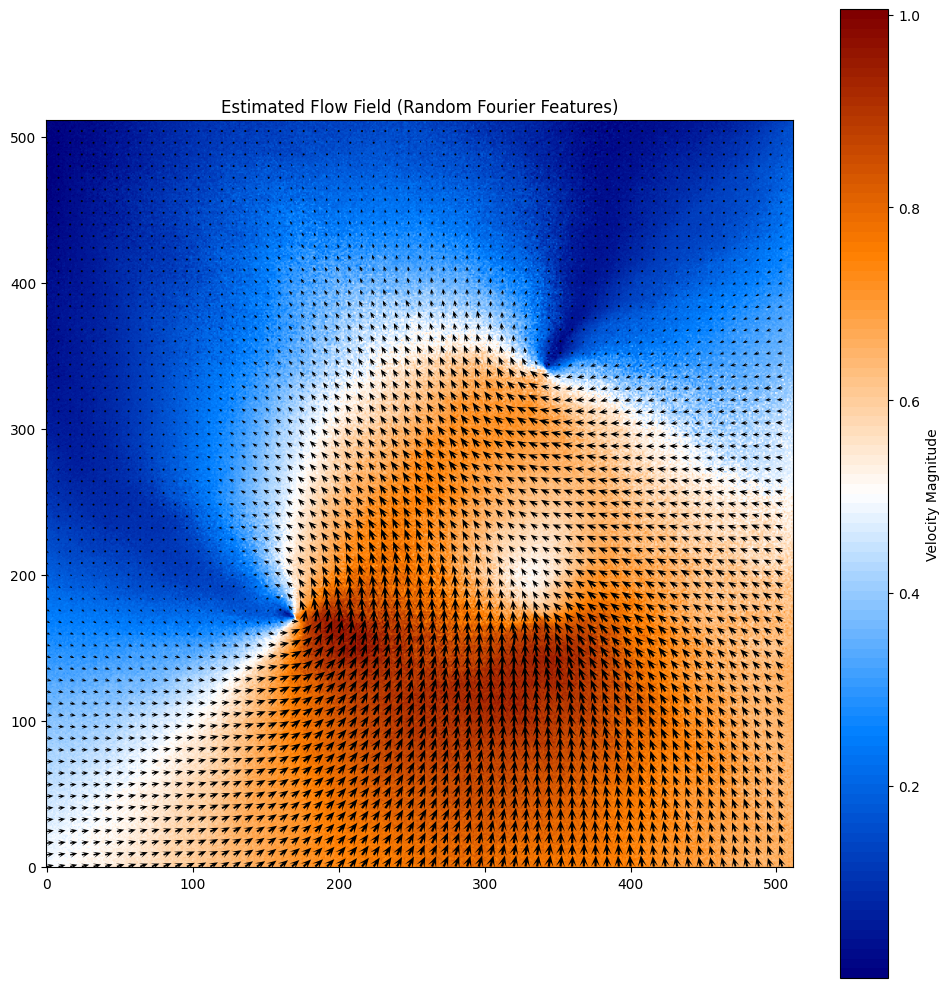

In [15]:
estimated_flow_rff = estimated_flow_tensor_rff.detach().cpu().numpy()
plot_flow_field(estimated_flow_rff, "Estimated Flow Field (Random Fourier Features)", SIZE // 8)

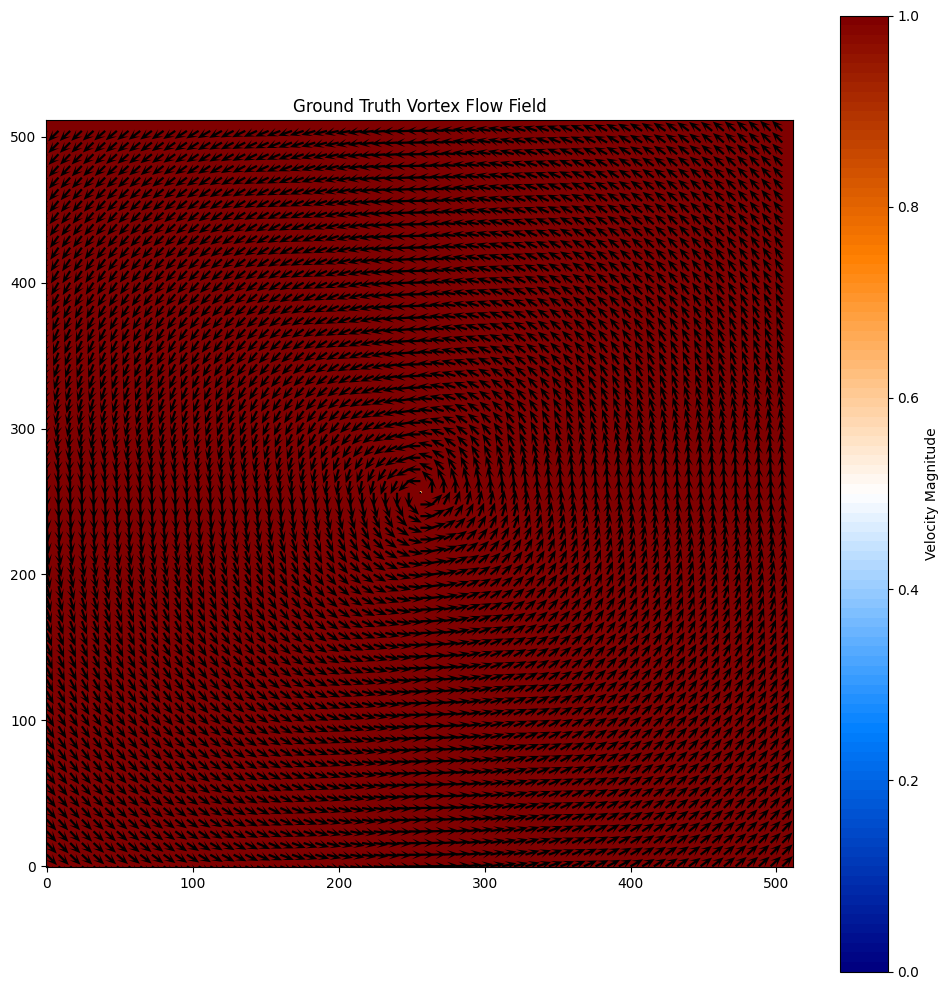

In [16]:
vortex_flow = generate_vortex_flow(SIZE)
plot_flow_field(vortex_flow, "Ground Truth Vortex Flow Field", SIZE // 8)

In [17]:
vortex_flow_tensor = torch.FloatTensor(vortex_flow)
vortex_flow_tensor = vortex_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_vortex_flow_tensor = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 25.257179260253906
Epoch 100, Loss: 0.1876891851425171
Epoch 200, Loss: 0.14533260464668274
Epoch 300, Loss: 0.09138283878564835
Epoch 400, Loss: 0.04399534687399864
Epoch 500, Loss: 0.03491642698645592
Epoch 600, Loss: 0.03100198321044445
Epoch 700, Loss: 0.029128707945346832
Epoch 800, Loss: 0.027896348387002945
Epoch 900, Loss: 0.026622284203767776
Epoch 1000, Loss: 0.02588645927608013
Epoch 2000, Loss: 0.021560894325375557
Epoch 3000, Loss: 0.01909998245537281
Epoch 4000, Loss: 0.017606433480978012
Epoch 5000, Loss: 0.01662599667906761
Epoch 6000, Loss: 0.016177581623196602
Epoch 7000, Loss: 0.01597895473241806
Epoch 8000, Loss: 0.015882985666394234
Epoch 9000, Loss: 0.015840992331504822
Epoch 10000, Loss: 0.015822265297174454


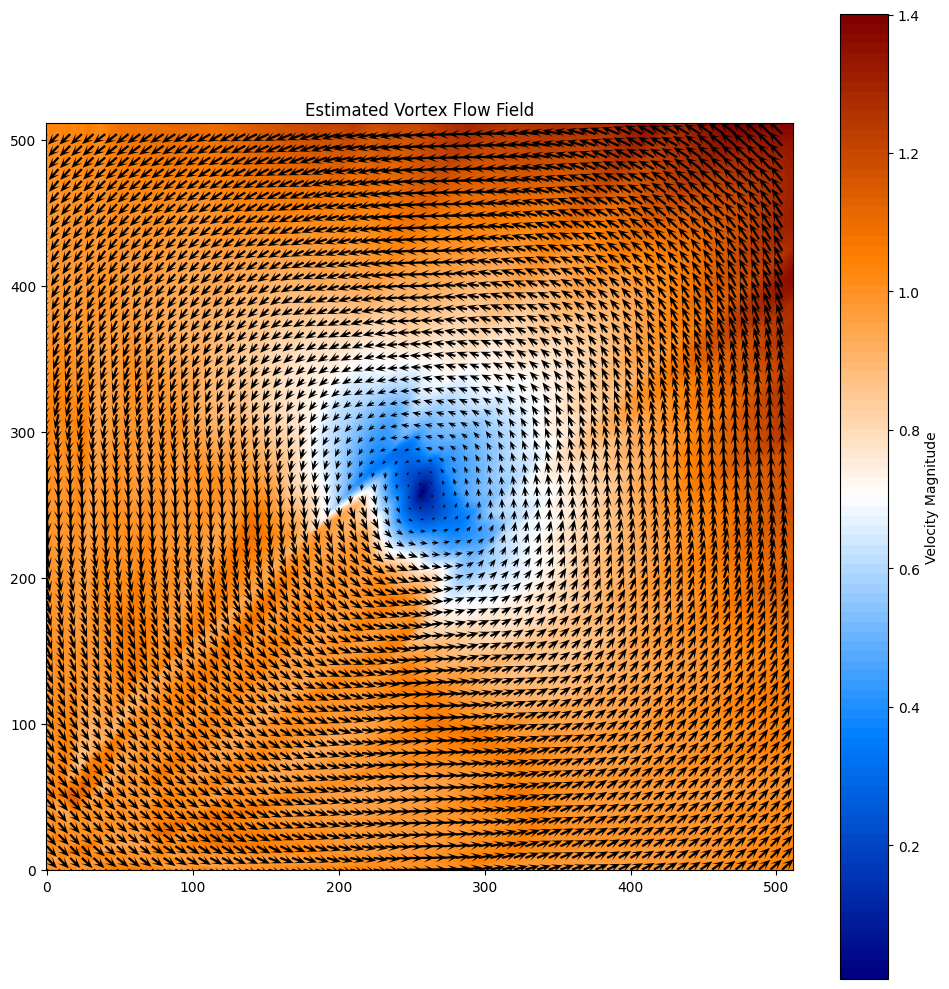

In [18]:
estimated_vortex_flow = estimated_vortex_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow, "Estimated Vortex Flow Field", SIZE // 8)

In [19]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_vortex_flow_tensor_ff = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 3.448486328125
Epoch 100, Loss: 0.022744081914424896
Epoch 200, Loss: 0.009138744324445724
Epoch 300, Loss: 0.0051305582746863365
Epoch 400, Loss: 0.0031915423460304737
Epoch 500, Loss: 0.002039539162069559
Epoch 600, Loss: 0.0014433269388973713
Epoch 700, Loss: 0.001213317969813943
Epoch 800, Loss: 0.001010059379041195
Epoch 900, Loss: 0.0008981662685982883
Epoch 1000, Loss: 0.0008092020871117711
Epoch 2000, Loss: 0.00046286670840345323
Epoch 3000, Loss: 0.0003646469849627465
Epoch 4000, Loss: 0.0003218648780602962
Epoch 5000, Loss: 0.0003005886101163924
Epoch 6000, Loss: 0.00028960718191228807
Epoch 7000, Loss: 0.0002838967484422028
Epoch 8000, Loss: 0.000281024316791445
Epoch 9000, Loss: 0.00027965696062892675
Epoch 10000, Loss: 0.0002790364087559283


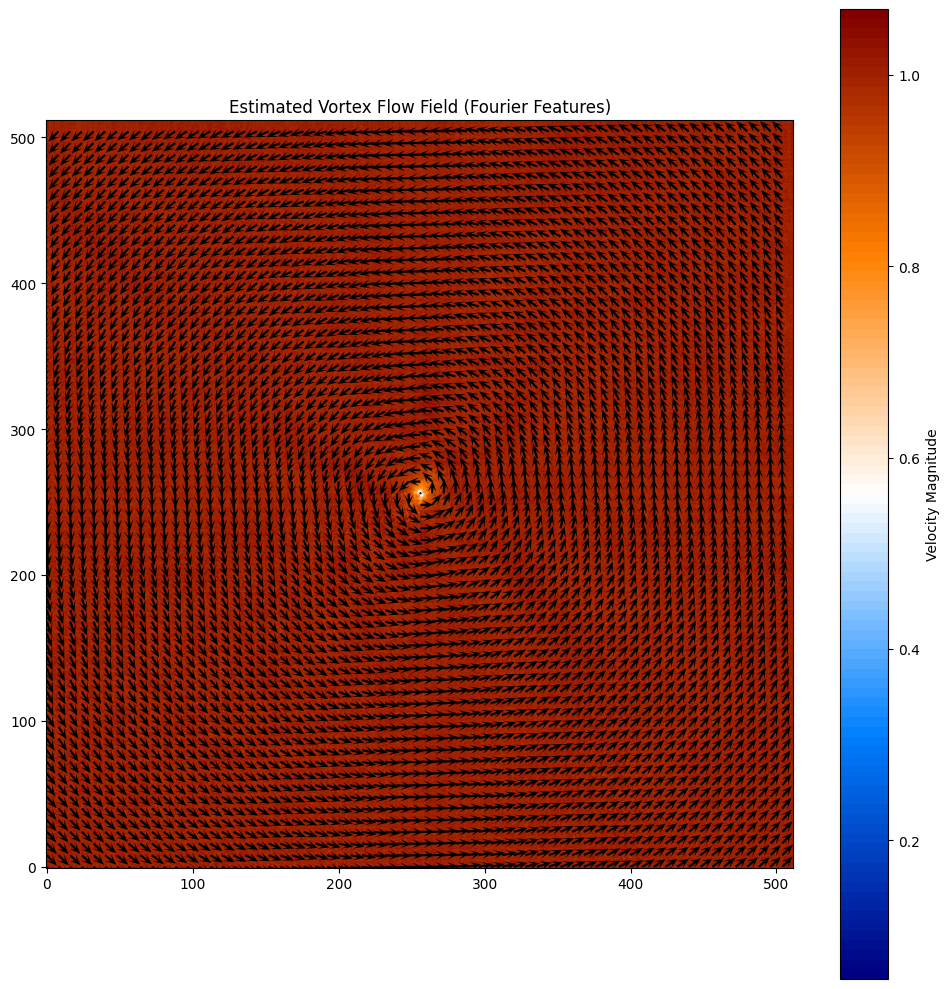

In [20]:
estimated_vortex_flow_ff = estimated_vortex_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow_ff, "Estimated Vortex Flow Field (Fourier Features)", SIZE // 8)

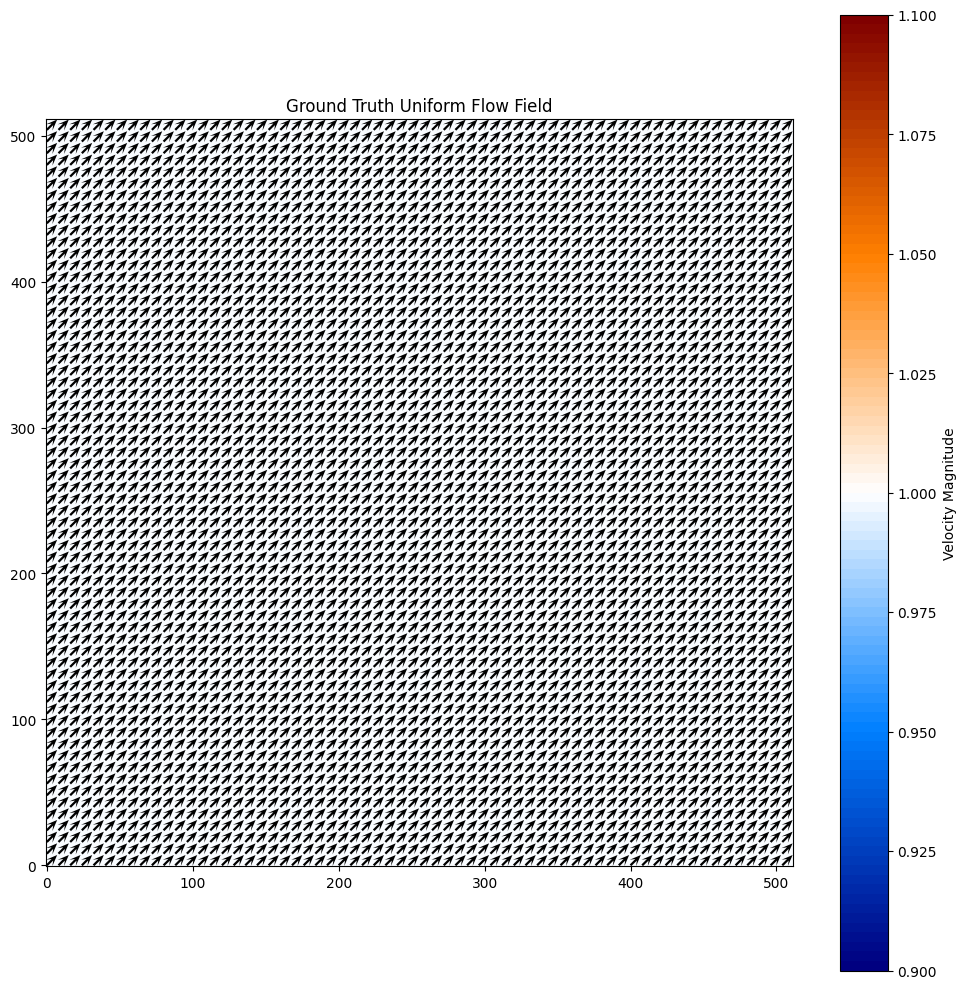

In [21]:
uniform_flow = generate_uniform_flow(SIZE)
plot_flow_field(uniform_flow, "Ground Truth Uniform Flow Field", SIZE // 8)

In [22]:
uniform_flow_tensor = torch.FloatTensor(uniform_flow)
uniform_flow_tensor = uniform_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_uniform_flow_tensor = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 8.727542877197266
Epoch 100, Loss: 0.048354942351579666
Epoch 200, Loss: 0.028495902195572853
Epoch 300, Loss: 0.007233413867652416
Epoch 400, Loss: 0.001999612431973219
Epoch 500, Loss: 0.00042247894452884793
Epoch 600, Loss: 0.0005700563779100776
Epoch 700, Loss: 0.0002151510852854699
Epoch 800, Loss: 0.0001511395676061511
Epoch 900, Loss: 0.0001289314532186836
Epoch 1000, Loss: 0.00011854701006086543
Epoch 2000, Loss: 7.544313848484308e-05
Epoch 3000, Loss: 6.357941310852766e-05
Epoch 4000, Loss: 5.668526500812732e-05
Epoch 5000, Loss: 5.411352321971208e-05
Epoch 6000, Loss: 5.2842475270153955e-05
Epoch 7000, Loss: 5.2202613005647436e-05
Epoch 8000, Loss: 5.189152216189541e-05
Epoch 9000, Loss: 5.173787212697789e-05
Epoch 10000, Loss: 5.16702639288269e-05


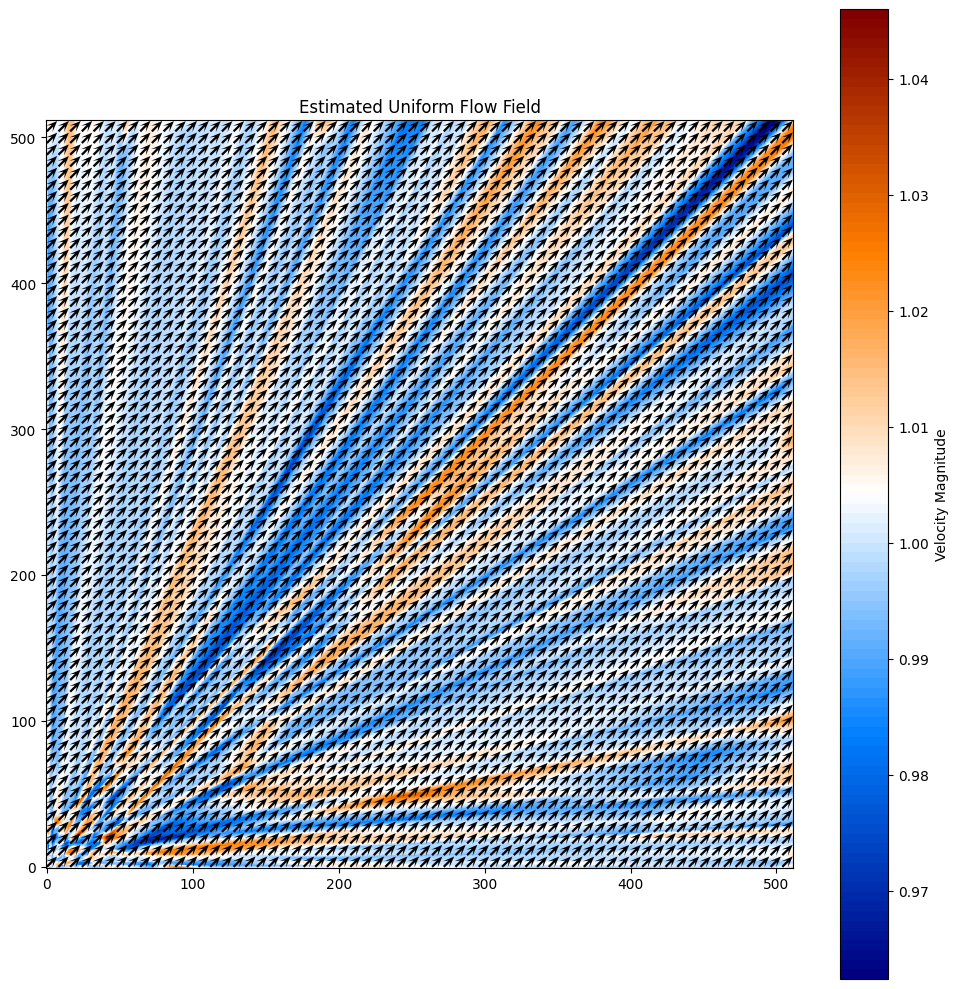

In [23]:
estimated_uniform_flow = estimated_uniform_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow, "Estimated Uniform Flow Field", SIZE // 8)

In [24]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_uniform_flow_tensor_ff = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.34178805351257324
Epoch 100, Loss: 0.0017470301827415824
Epoch 200, Loss: 0.00074217957444489
Epoch 300, Loss: 0.0004550052108243108
Epoch 400, Loss: 0.00033718542545102537
Epoch 500, Loss: 0.0002731305139604956
Epoch 600, Loss: 0.00022692196944262832
Epoch 700, Loss: 0.0002063876308966428
Epoch 800, Loss: 0.00018008466577157378
Epoch 900, Loss: 0.00016474889707751572
Epoch 1000, Loss: 0.0001523747923783958
Epoch 2000, Loss: 9.248842252418399e-05
Epoch 3000, Loss: 7.103768439264968e-05
Epoch 4000, Loss: 6.11696596024558e-05
Epoch 5000, Loss: 5.610274092759937e-05
Epoch 6000, Loss: 5.341764699551277e-05
Epoch 7000, Loss: 5.2002331358380616e-05
Epoch 8000, Loss: 5.128539487486705e-05
Epoch 9000, Loss: 5.0943221140187234e-05
Epoch 10000, Loss: 5.078924368717708e-05


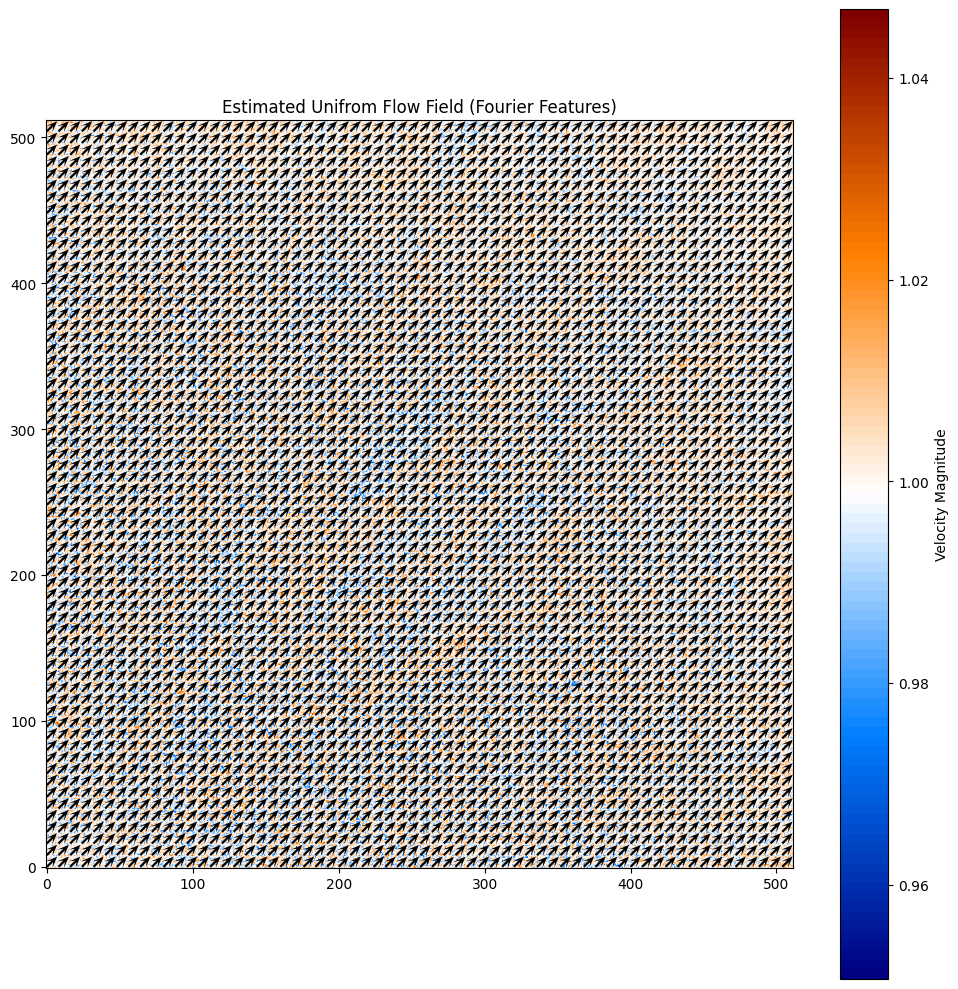

In [25]:
estimated_uniform_flow_ff = estimated_uniform_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow_ff, "Estimated Unifrom Flow Field (Fourier Features)", SIZE // 8)